# Домашнее задание №1

В этом домашнем задании вам предлагается обучить модель регрессии для предсказания стоимости автомобилей, а также реализовать веб-сервис для применения построенной модели на новых данных.

> Оценка за домашку = min(ваш балл, 10)

Задания, <font color='#9933CC'>выделенные фиолетовым</font>, требуют от вас написания кода.

А вопросы, <font color='#FF6600'>выделенные оранжевым</font>, текстового ответа.

Оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

random.seed(42)
np.random.seed(42)

 Ниже ответьте на вопрос <font color='#FF6600'>
"Для чего фиксируем сиды в домашках?"</font>

Фиксируем сиды в домашках для фиксирования полученных результатов (например, при генерации случайных чисел) при каждом запуске кода.

# Часть 1 (2.5 балла + 0.75) | EDA

## Простейший EDA и обработка признаков (1.5 балла + 0.25)

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


(0.15 балла) <font color='#9933CC'>Отобразите 10 **случайных** строк тренировочного датасета</font>

In [3]:
df_train.sample(10, random_state=42)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


(0.1 балла) <font color='#9933CC'>Отобразите первые 5 и последние 5 объектов тестового датасета</font>

In [4]:
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


(0.1 балла) <font color='#9933CC'>Посчитайте основные статистики как по числовым, так и по категориальным столбцам для трейна и теста</font>. 
> Подсказка: ``.describe()`` с нужным(и) аргументом(-ами)


In [6]:
df_train.describe(include=np.number)

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [7]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [8]:
df_test.describe(include=np.number)

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [9]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


(0.15 балла) <font color='#9933CC'>Посмотрите, есть ли в датасете пропуски.</font>

<font color='#FF6600'>Если есть, то в каких колонках?</font>

In [10]:
test_na_count = df_test.isna().sum()
print(f'В тестовом датасете пропуски в колонках: {list(test_na_count[test_na_count != 0].index)}')
test_na_count

В тестовом датасете пропуски в колонках: ['mileage', 'engine', 'max_power', 'torque', 'seats']


name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [11]:
train_na_count = df_train.isna().sum()
print(f'В тренировочном датасете пропуски в колонках: {list(train_na_count[train_na_count != 0].index)}')
train_na_count

В тренировочном датасете пропуски в колонках: ['mileage', 'engine', 'max_power', 'torque', 'seats']


name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

(0.1 балла) <font color='#9933CC'>Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием</font> (целевую переменную следует исключить). Если есть, то сколько?

In [12]:
target = 'selling_price'
features = list(df_train.columns.difference([target]))
duplicate = df_train.duplicated(subset=features)
duplicate.sum()

1159

(0.15 балла) <font color='#9933CC'>Отобразите такие объекты</font>

In [13]:
df_train[duplicate]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


(0.15 балла) <font color='#9933CC'>Удалите повторяющиеся строки</font>. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю

In [14]:
df_train = df_train.drop_duplicates(subset=features)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6992,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
6993,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [15]:
df_train.shape

(5840, 13)

In [16]:
assert df_train.shape == (5840, 13)

(0.1 балла) Чтоб все было по красоте, <font color='#9933CC'>обновите индексы строк таким образом, чтобы они шли от 0 без пропусков</font>

In [17]:
df_train.reset_index(inplace=True, drop=True)

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не слава богу. Давайте починим.

(0.25 балла) Задача такая: 
<font color='#9933CC'>
* убрать единицы измерения для признаков ``mileage, engine, max_power``. 
* кастануть эти столбцы столбцы к ``float``.
* удалить столбец ``torque``
</font>

> Все действия нужно производить над обоими датасетами

---
**Доп (0.25 балла):**
* <font color='#9933CC'>Вместо удаления признак `torque` разделите на два: собственно `torque` и `max_torque_rpm`.</font> Учтите единицы измерения. Они разные ☹

In [18]:
# Чистим колонки
def clean_col(s):
    try: 
        float_s = float(s.split()[0])
        return float_s
    except: 
        return np.nan

df_train['mileage'] = df_train['mileage'].apply(clean_col)
df_train['max_power'] = df_train['max_power'].apply(clean_col)
df_train['engine'] = df_train['engine'].apply(clean_col)

df_test['mileage'] = df_test['mileage'].apply(clean_col)
df_test['max_power'] = df_test['max_power'].apply(clean_col)
df_test['engine'] = df_test['engine'].apply(clean_col)

In [19]:
# Преобразовываем torque, а не удаляем
def find_digit(s):
    try:
        return float(re.search('\d+', s).group())
    except:
        return np.nan

def find_max_torque(s):
    try:
        return max(map(float, re.findall('\d+', re.sub('[\.,]', '', s))))
    except:
        return np.nan

def kg_to_nm(s):
    return round(s*9.80665, 3)

def split_torque(df, col_name='torque'):
    torque_nm = df[df[col_name].str.lower().str.contains('nm', na=False)][col_name]
    torque_kg = df[df[col_name].str.lower().str.contains('kg', na=False)][col_name]
    torque_nm_kg = df.loc[list(set(torque_nm.index).intersection(set(torque_kg.index))), col_name]
    index_nounits = df.index.difference(torque_nm.index).difference(torque_kg.index)
    torque_no_units = df.loc[index_nounits, col_name]
    torque_nm = torque_nm.loc[torque_nm.index.difference(torque_nm_kg.index)]
    torque_kg = torque_kg.loc[torque_kg.index.difference(torque_nm_kg.index)]
    
    torque_nm_split = torque_nm.str.split(' ', n=1, expand=True)
    torque_nm_new = torque_nm_split[0].apply(find_digit).astype(float)
    torque_nm_max_new = torque_nm_split[1].apply(find_max_torque).astype(float)

    torque_kg_split = torque_kg.str.split(' ', n=1, expand=True)
    torque_kg_new = torque_kg_split[0].apply(find_digit).apply(kg_to_nm).astype(float)
    torque_kg_max_new = torque_kg_split[1].apply(find_max_torque).astype(float)

    torque_nm_kg_split = torque_nm_kg.str.split(' ', n=1, expand=True)
    if not torque_nm_kg_split.empty:
        torque_nm_kg_new = torque_nm_kg_split[0].apply(find_digit).astype(float)
        torque_nm_kg_max_new = torque_nm_kg_split[1].apply(find_max_torque).astype(float)
    else:
        torque_nm_kg_new = pd.Series(dtype=float)
        torque_nm_kg_max_new = pd.Series(dtype=float)

    torque_no_units_split = torque_no_units.str.split(' ', n=1, expand=True)
    torque_no_units_new = torque_no_units_split[0].apply(find_digit).astype(float)
    torque_no_units_max_new = torque_no_units_split[1].apply(find_max_torque).astype(float)

    torque_new = pd.DataFrame(pd.concat([torque_nm_new, torque_kg_new, torque_no_units_new, torque_nm_kg_new], axis=0))
    
    torque_max_new = pd.DataFrame(pd.concat([torque_nm_max_new, torque_kg_max_new, torque_no_units_max_new, torque_nm_kg_max_new], axis=0))
    result_df = pd.concat([torque_new, torque_max_new], axis=1)
    result_df.columns = ['torque', 'max_torque_rpm']

    return result_df.sort_index()


df_train[['torque','max_torque_rpm']] = split_torque(df_train)
df_test[['torque','max_torque_rpm']] = split_torque(df_test)

In [20]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,215.746,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,107.873,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.000,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.000,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.000,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.000,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.360,5.0,2750.0


In [21]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260.000,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260.000,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172.000,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200.000,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96.000,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.000,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.000,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,215.746,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.000,5.0,4000.0


(0.15 балла) <font color='#9933CC'>Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось</font>

> Обратите внимание, что, по уму, нужно посчитать медиану по трейну и этим средним заполнять пропуски в тесте. Так же делаем, если, например, стандартизируем признаки.

In [22]:
train_na_count_new = df_train.isna().sum()
na_columns = list(train_na_count_new[train_na_count_new != 0].index)
df_train[na_columns] = df_train[na_columns].fillna(df_train.median(numeric_only=True))

In [23]:
# Проверка
df_train.isna().sum().sum()

0

In [24]:
test_na_count_new = df_test.isna().sum()
na_columns = list(test_na_count_new[test_na_count_new != 0].index)
df_test[na_columns] = df_test[na_columns].fillna(df_train.median(numeric_only=True))

In [25]:
# Проверка
df_test.isna().sum().sum()

0


(0.1 балла) Теперь, когда не осталось пропусков, можно <font color='#9933CC'>преобразовать столбцы к более подходящим типам (``engnine`` и ``seats`` к int)
</font>

Ниже ответьте, <font color='#FF6600'>почему (хоть мы этого и не делаем) ``seats``, возможно, лучше сделать переменной категориальной, а не целочисленной.</font>

Этот признак обозначает количество мест в автомобиле; для данного признака есть ограниченный и фиксированный набор категорий (таких категорий всего 9 в df_train (например, в отличие от engine), в df_test еще меньше). Если мы рассматриваем seats как целочисленную переменную, модель может ошибочно интерпретировать порядок чисел и считать, что 9 сидений в два раза больше, чем 5 сидений, что может быть неправильно. Следует признак seats отнести к категориальным.

In [29]:
df_train[['engine', 'seats']] = df_train[['engine', 'seats']].astype(int)
df_test[['engine', 'seats']] = df_test[['engine', 'seats']].astype(int)

In [30]:
df_train['seats'].unique()

array([ 5,  4,  7,  8,  6,  9, 10, 14,  2])

## Визуализации (1 балл + 0.5)

Визуализировать нам надо не так уж и много. Во-первых, хотелось бы, в принципе, увидеть как распределены значения признаков. Также хотелось бы понять, насколько признаки скоррелированы между собой и с целевой переменной. А ещё неплохо бы посмотреть, не оказалось ли так, что тестовые данные распределены иначе, чем трейн.

Этим всем и предлагаем вам заняться.

(0.25 балла) <font color='#9933CC'>Посторойте попарные распределения всех числовых признаков для трейна.</font>

> ``sns.pairplot()`` позволяет сделать это в одну строчку

<Figure size 2000x2000 with 0 Axes>

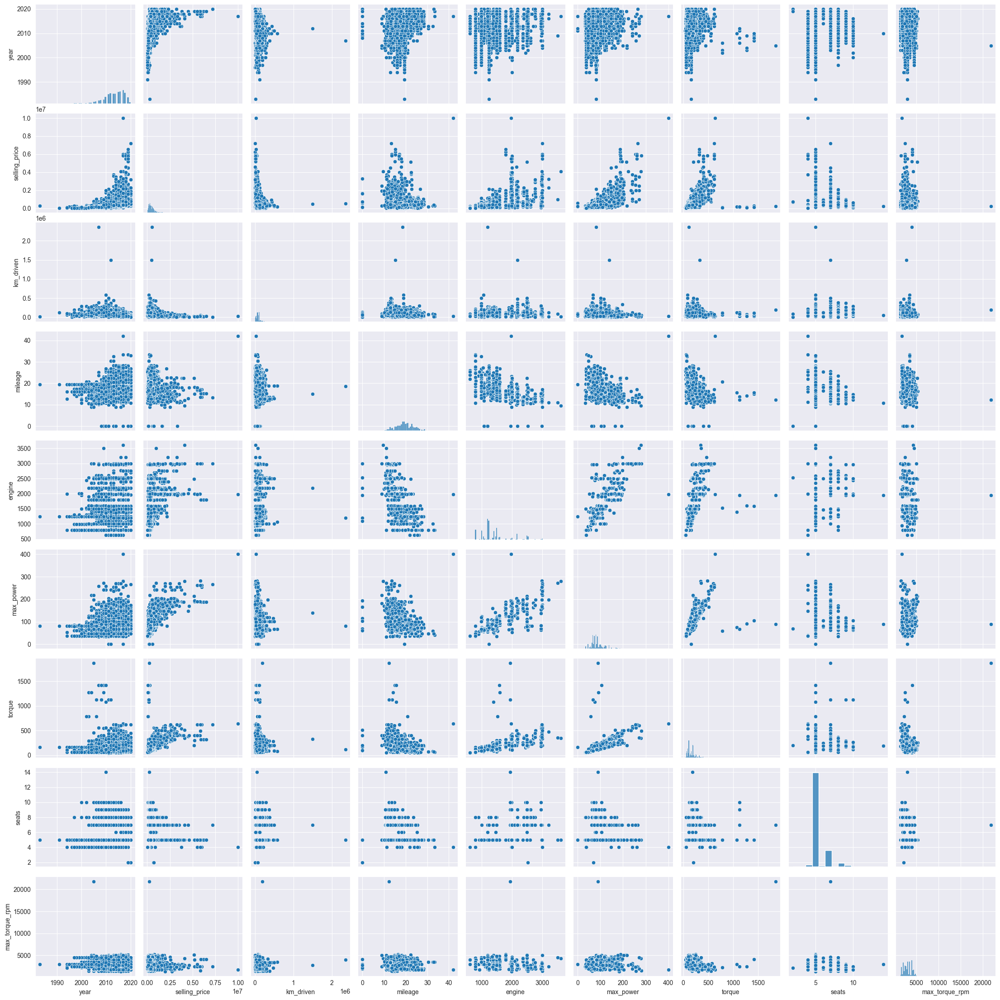

In [31]:
fig = plt.figure(figsize=(20, 20))
sns.pairplot(df_train)
plt.show()

Этот график не такой информативный, как можно было бы построить, беря признаки по отдельности. Но он позволяет сделать некоторые (возможно, далеко идущие) выводы. Впрочем, со многими из них (если не со всеми) вы бы справились умозрительно. Однако всегда приятно делать выводы, основываясь на данных. 



* <font color='#FF6600'> Что можно сказать о связи предикторов с целевой переменной?
* <font color='#FF6600'> А о корреляциях признаков? </font>

* Предикторы с целевой переменной имеют разные связи. Так, цена с годом (year) имеет квадратичную зависимость, а с пробегом (km_driven), предположительно, обратную квадратичную. С признаками engine, max_power, torque целевая переменная имеет линейную зависимость. Для mileage с selling price можно предположить нормальное распределение. Seats представлена в виде дискретных значений, что может говорить о том, что признак в большей степени является категориальным. В max_torque_rpm заметен выброс в значении близком к 22000. Не учитывая выброс и исходя из зависимости torque, можно предположить, что зависимость max_torque_rpm и selling price линейная.
* Между собой признаки коррелируют по-разному: где-то видна положительная линейная зависимость (например, torque и max_power или engine и max_power), высокая плотность точек в некоторой области может указывать на устойчивую связь (например, max_power и mileage, km_driven и mileage), нелинейная связь (вероятно, km_driven и torque), наличие отстоящих точек от облака, говорит о выбросах (max_torque c другими признаками).
 Для лучшего анализа корреляции признаков между собой нужно построить и проанализировать тепловую карту корреляции признаков.

(0.25 балла) <font color='#9933CC'>Постройте pairplot по тестовым данным</font> и ответьте на вопрос <font color='#FF6600'>"Похожими ли оказались совокупности при разделении на трейн и тест?"</font>

В целом, при разделении на трейн и тест совокупности похожи, за исключением некоторых (например, seats с другими признаками или max_torque_rpm из-за выброса в train отличается от test).

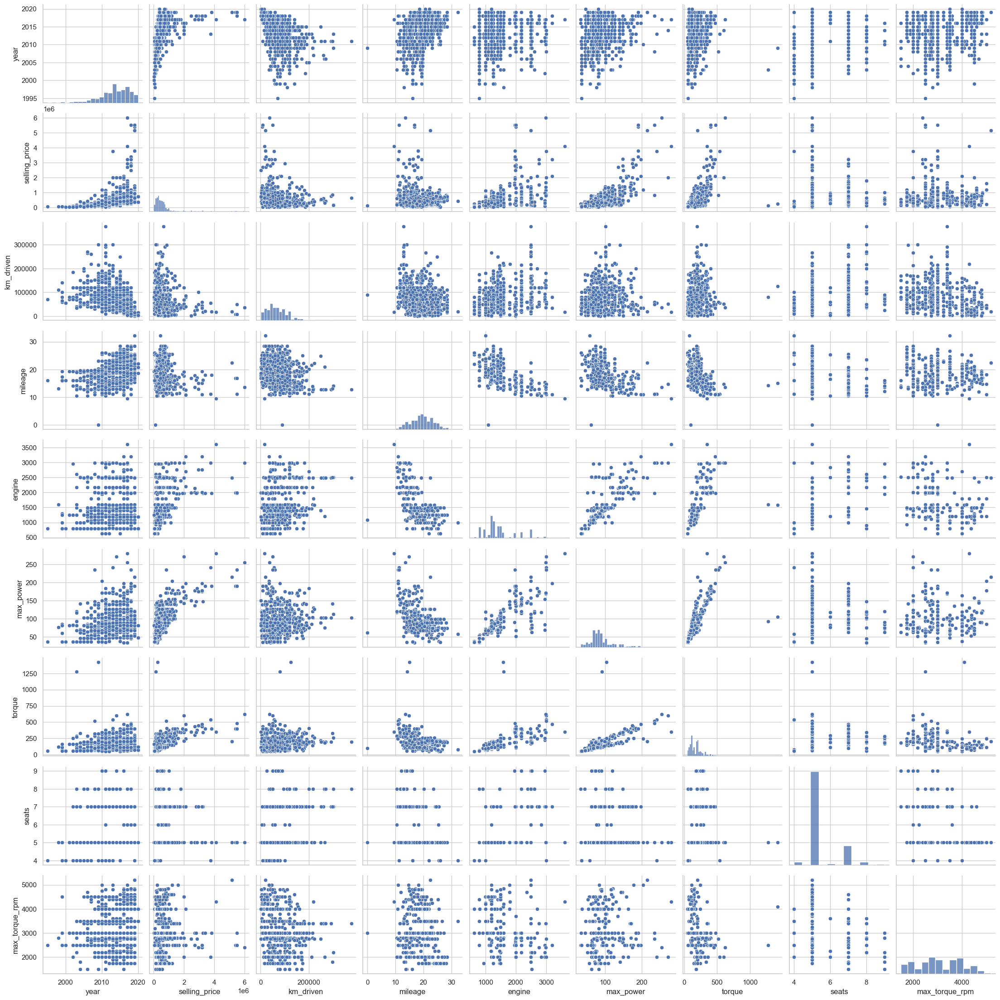

In [70]:
sns.pairplot(df_test)

(0.25 балла) <font color='#9933CC'>Для трейна давайте построим тепловую карту (heatmap из библиотеки seaborn) попарных корреляций числовых колонок</font>

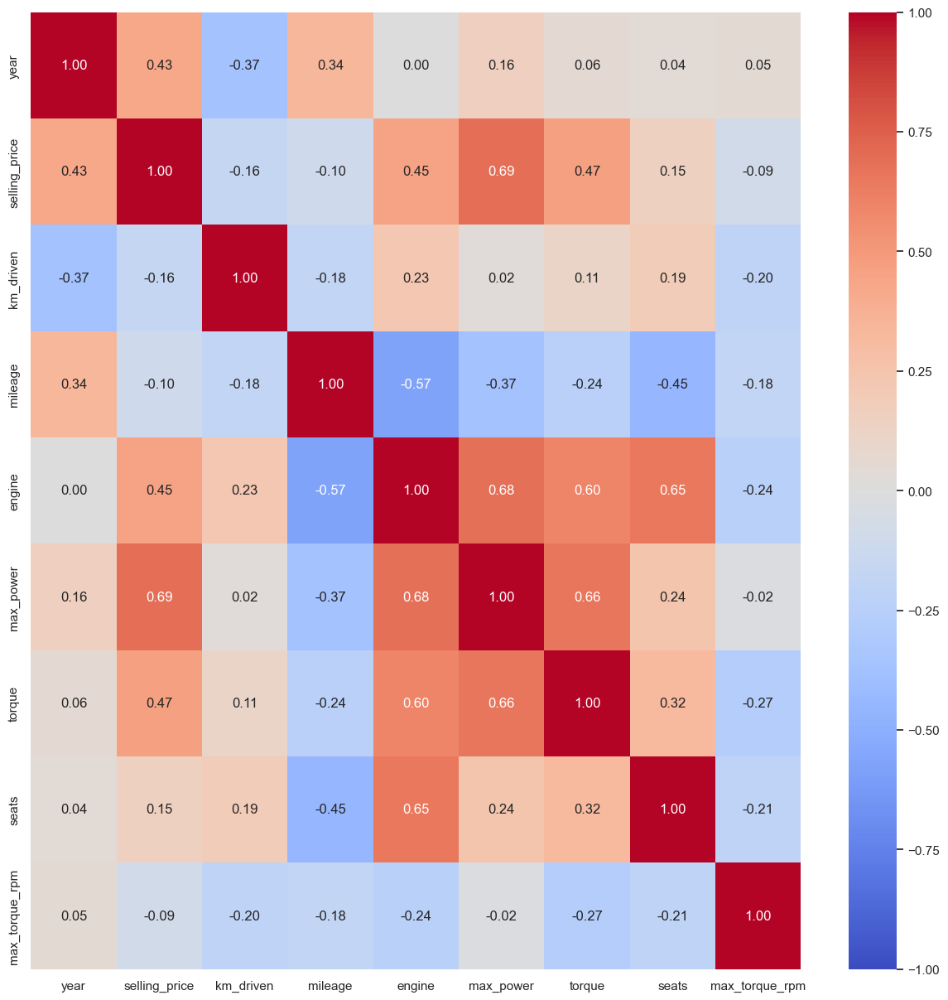

In [71]:
fig, ax = plt.subplots(figsize=(15, 15))
train_corr = df_train.corr(numeric_only=True)
sns.heatmap(train_corr, annot=True, fmt= '.2f', vmin=-1, vmax=1, center=0, cmap='coolwarm', ax=ax)
plt.show()

Ответьте, пожалуйста, на вопросы: 
* <font color='#FF6600'>Какие 2 признака наименее скоррелированы между собой?</font>
* <font color='#FF6600'>Между какими наблюдается довольно сильная положительная линейная зависимость?</font>
* <font color='#FF6600'>Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.</font>

In [72]:
# Наименее скоррелированные признаки
min_abs_corr = train_corr.abs().unstack().sort_values().drop_duplicates()
print("Наименее скоррелированные признаки (по абсолютному значению):")
print(min_abs_corr.head(1))

Наименее скоррелированные признаки (по абсолютному значению):
engine  year    0.002819
dtype: float64


In [73]:
# Находим сильную положительную линейную зависимость
strong_pos_corr = train_corr.unstack().sort_values(ascending=False).drop_duplicates()
print("Сильная положительная линейная зависимость:")
print(strong_pos_corr.index[2])
print("Корреляция между ними:\n", strong_pos_corr.iloc[2])

Сильная положительная линейная зависимость:
('engine', 'max_power')
Корреляция между ними:
 0.6811168062913218


In [74]:
correlation_year_km_driven = df_train['year'].corr(df_train['km_driven'])
print(f"Корреляция между year и km_driven: {correlation_year_km_driven}")
if correlation_year_km < 0:
    print("Можно утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.")
else:
    print("Нельзя утверждать, что чем меньше год, тем больше километров проехала машина.")

Корреляция между year и km_driven: -0.36896578600118
Можно утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.


(0.25 балла) <font color='#9933CC'> Отобразите диаграмму рассеяния для наиболее скореллированной пары **признаков** (на трейне) </font>

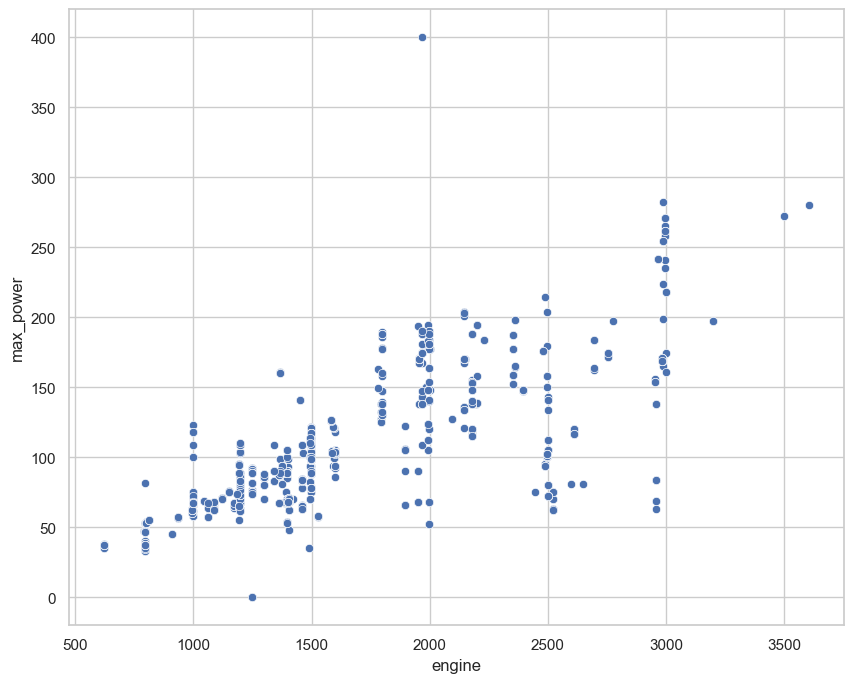

In [75]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.scatterplot(x= df_train['engine'], y= df_train['max_power'], data=df_train)
plt.show()

### Дополнительные визуализации (бонус 0.5 балла)

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

# Часть 2 (1.25 балла) | Модель только на вещественных признаках

(0.05 балла) <font color='#9933CC'>В переменные ``y_train`` и ``y_test`` запишите значения целевых переменных. Столбцы ``selling_price`` из датафреймов необходимо удалить. Категориальные (все, кроме ``seats``) столбцы тоже.</font>

In [76]:
df_train_num = df_train.select_dtypes(exclude=object)
target = 'selling_price'
y_train = df_train_num[target]
X_train = df_train_num.drop(target, axis=1)

In [77]:
# Не дропнут torque(и добавлен max_torque)
assert X_train.shape == (5840, 8)

In [78]:
df_test_num = df_test.select_dtypes(exclude=object)
y_test = df_test_num[target]
X_test = df_test_num.drop(target, axis=1)

(0.2 балла) <font color='#9933CC'>Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и MSE для трейна и для теста</font>

**Замечание:** $R^2$ и MSE для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [80]:
def print_metrics(model, xtrain, xtest, ytrain, ytest, name):
    print(name)
    r2 = r2_score(ytrain, model.predict(xtrain))
    mse = MSE(ytrain, model.predict(xtrain))
    print(f'TRAIN:\nR2:{r2}\nMSE:{mse}')

    r2 = r2_score(ytest, model.predict(xtest))
    mse = MSE(ytest, model.predict(xtest))
    print(f'TEST:\nR2:{r2}\nMSE:{mse}')

In [81]:
print_metrics(lr, X_train, X_test,  y_train, y_test, 'Simple LinReg')

Simple LinReg
TRAIN:
R2:0.6011345970537664
MSE:114330116328.95728
TEST:
R2:0.6003989539426173
MSE:229702092136.77682


Запомните правило:

> Использую линейную модель -- стандартизирую фичи

(0.25 балла) <font color='#9933CC'>Воспользуемся им</font>

In [82]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_scale = LinearRegression()
lr_scale.fit(X_train_scaled, y_train)

print_metrics(lr_scale, X_train_scaled, X_test_scaled,  y_train, y_test, 'Scaled LinReg')

Scaled LinReg
TRAIN:
R2:0.6011345970537655
MSE:114330116328.95753
TEST:
R2:0.600398953942623
MSE:229702092136.7735


Не очень результативно.

Зато уже сейчас можем интерпретировать модель. <font color='#FF6600'>"Какой признак оказался наиболее информативным в предсказании цены?"</font>

По коэффициентам можно сказать, что признак max_power имеет наибольший положительный коэффициент 328753,661954. Увеличение значения max_power приведет к наибольшему увеличению предсказанной цены, то есть этот признак оказался наиболее информативным.

In [84]:
pd.DataFrame(zip(lr_scale.feature_names_in_, lr_scale.coef_), columns=['feature', 'coeff'])

,feature,coeff
0,year,165643.509300
1,km_driven,-48950.953771
2,mileage,-8505.015135
3,engine,22313.166368
4,max_power,328753.661954
5,torque,7985.982222
6,seats,-30425.983927
7,max_torque_rpm,-58839.745723


(0.25 балла) <font color='#9933CC'>Теперь попробуем Lasso-регрессию.</font> Здесь и дальше обучайте модели на нормализованных признаках

In [90]:
from sklearn.linear_model import Lasso

lasso_scale = Lasso()
lasso_scale.fit(X_train_scaled, y_train)

print_metrics(lasso_scale, X_train_scaled, X_test_scaled, y_train, y_test, 'Scaled Lasso')

Scaled Lasso
TRAIN:
R2:0.6011345970063546
MSE:114330116342.5473
TEST:
R2:0.6003976730886713
MSE:229702828408.20056


<font color='#FF6600'>Занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Почему же?</font>

L1-регуляризация с дефолтными параметрами (alpha=1.0) не занулила веса. Судя по всему, дефолтный параметр регуляризации не является оптимальным для зануления весов для нашей модели, вероятно, необходимо подобрать alpha значением повыше. Если признаки имеют разный масштаб, то также на силу регуляризации может влиять и масштабирование признаков.

In [93]:
pd.DataFrame(zip(lasso_scale.feature_names_in_, lasso_scale.coef_), columns=['feature', 'coeff'])

,feature,coeff
0,year,165641.313484
1,km_driven,-48950.010312
2,mileage,-8501.730661
3,engine,22311.159238
4,max_power,328755.065470
5,torque,7985.341638
6,seats,-30422.000181
7,max_torque_rpm,-58837.665076


(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии</font>

Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

In [115]:
from sklearn.model_selection import GridSearchCV
params = {
    'alpha': list(np.arange(0.1, 100, 0.1)),
    'max_iter': [1000, 2000, 3000, 4000]
}

grid = GridSearchCV(Lasso(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 3996 candidates, totalling 39960 fits


GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6,
                                   0.7000000000000001, 0.8, 0.9, 1.0, 1.1,
                                   1.2000000000000002, 1.3000000000000003,
                                   1.4000000000000001, 1.5000000000000002, 1.6,
                                   1.7000000000000002, 1.8000000000000003,
                                   1.9000000000000001, 2.0, 2.1, 2.2,
                                   2.3000000000000003, 2.4000000000000004,
                                   2.5000000000000004, 2.6, 2.7,
                                   2.8000000000000003, 2.9000000000000004,
                                   3.0000000000000004, ...],
                         'max_iter': [1000, 2000, 3000, 4000]},
             verbose=1)

In [116]:
best_cv = grid.best_estimator_
print(grid.best_params_)
print_metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid Lasso')

{'alpha': 99.9, 'max_iter': 1000}
Grid Lasso
TRAIN:
R2:0.6011341099440786
MSE:114330255953.2688
TEST:
R2:0.6002702079814988
MSE:229776098991.65082


<font color='#FF6600'>Сколько грид-сёрчу пришлось обучать моделей?</font>

In [117]:
print(f'Грид-сёрчу пришлось обучать 39960 моделей.')

Грид-сёрчу пришлось обучать 39960 моделей.


<font color='#FF6600'>Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?</font>

In [118]:
print(grid.best_params_)

{'alpha': 99.9, 'max_iter': 1000}


In [119]:
pd.DataFrame(zip(best_cv.feature_names_in_, best_cv.coef_), columns=['feature', 'coeff'])

,feature,coeff
0,year,165416.429088
1,km_driven,-48857.887752
2,mileage,-8165.535614
3,engine,22116.431525
4,max_power,328896.141328
5,torque,7921.489087
6,seats,-30023.892159
7,max_torque_rpm,-58628.012802


Веса не занулились из-за недостаточной величины коэффициента регуляризации(99.9).

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html)-регрессии</font>

In [122]:
from sklearn.linear_model import ElasticNet

from sklearn.model_selection import GridSearchCV
params = {
    'alpha': list(np.arange(0.1, 10, 0.1)),
    'l1_ratio': list(np.arange(0, 1, 0.01)),
    'max_iter': [1000, 2000, 3000, 4000]
}
grid = GridSearchCV(ElasticNet(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 39600 candidates, totalling 396000 fits


C:\Users\SAMAROVEC\PycharmProjects\pythonProject\venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.748e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
C:\Users\SAMAROVEC\PycharmProjects\pythonProject\venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.456e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fi

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6,
                                   0.7000000000000001, 0.8, 0.9, 1.0, 1.1,
                                   1.2000000000000002, 1.3000000000000003,
                                   1.4000000000000001, 1.5000000000000002, 1.6,
                                   1.7000000000000002, 1.8000000000000003,
                                   1.9000000000000001, 2.0, 2.1, 2.2,
                                   2.3000000000000003, 2.4000000000000004,
                                   2.5000000000000004, 2.6, 2.7,
                                   2.8000000000000003, 2.9000000000000004,
                                   3.0000000000000004, ...],
                         'l1_ratio': [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06,
                                      0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13,
                                      0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2,
                                      0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27,
                                      0.28, 0.29, ...],
                         'max_iter': [1000, 2000, 3000, 4000]},
             verbose=1)

In [124]:
best_cv = grid.best_estimator_
print_metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid ElasticNet')

Grid ElasticNet
TRAIN:
R2:0.5945753828880572
MSE:116210238578.34966
TEST:
R2:0.5748548394796034
MSE:244385578558.6142


<font color='#FF6600'>Какие гиперпараметры соответствуют лучшей из перебранных моделей?</font>

In [125]:
print(grid.best_estimator_)

ElasticNet(alpha=5.6, l1_ratio=0.98)


Предлагаем вам оставить вам попытки заметно улучшить качество модели регуляризацией и перейти к следующей части задания.

# Часть 3 (0.5 балла) | Добавляем категориальные фичи


(0 баллов) <font color='#9933CC'>Из ``df_train`` удалите столбцы с целевой переменной и названием автомобиля.</font>

In [126]:
X_train_cat = df_train.drop(['name', 'selling_price'], axis=1)
X_train_cat

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000,5,2000.0
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000,5,2500.0
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,215.746,5,2750.0
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,107.873,5,4500.0
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.000,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.000,5,3000.0
5836,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.000,5,3500.0
5837,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.000,5,4000.0
5838,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.360,5,2750.0


In [127]:
assert X_train_cat.shape == (5840, 12)

In [128]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


(0.5 балла) <font color='#9933CC'>Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования</font>

> Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot. 

In [129]:
from sklearn.preprocessing import OneHotEncoder

ehc = OneHotEncoder(handle_unknown='ignore')
categorical_features = X_train_cat.select_dtypes(include=['object']).columns
X_train_con = pd.concat([X_train_cat[categorical_features], X_train_cat['seats'].astype(str)], axis=1)
X_train_ohe = ehc.fit_transform(X_train_con)
X_train_ohe_df = pd.DataFrame(X_train_ohe.toarray(), columns=ehc.get_feature_names_out(list(X_train_con.columns)))
X_train_cat = X_train_cat.drop(categorical_features, axis=1)
X_train_cat = pd.concat([X_train_cat, X_train_ohe_df.astype(int)], axis=1).drop(['seats'], axis=1)

In [131]:
X_train_cat

,year,km_driven,mileage,engine,max_power,torque,max_torque_rpm,fuel_CNG,fuel_Diesel,fuel_LPG,...,owner_Third Owner,seats_10,seats_14,seats_2,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9
0,2014,145500,23.40,1248,74.00,190.000,2000.0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,2014,120000,21.14,1498,103.52,250.000,2500.0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
2,2010,127000,23.00,1396,90.00,215.746,2750.0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,2007,120000,16.10,1298,88.20,107.873,4500.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,2017,45000,20.14,1197,81.86,113.000,4000.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,17.92,1086,62.10,96.000,3000.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5836,2013,50000,18.90,998,67.10,90.000,3500.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5837,2013,110000,18.50,1197,82.85,113.000,4000.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5838,2007,119000,16.80,1493,110.00,235.360,2750.0,0,1,0,...,0,0,0,0,0,1,0,0,0,0


(0.25 балла) <font color='#9933CC'>Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV`.</font> В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.

<font color='#FF6600'>Удалось ли улучшить качество предсказаний?</font>

In [132]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

params = {
    'alpha': list(np.arange(0.1, 1000, 0.1)),
}
        
grid = GridSearchCV(Ridge(), params, cv=10, verbose=2)
grid.fit(X_train_cat, y_train)

Fitting 10 folds for each of 9999 candidates, totalling 99990 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.2; total time=   0.0s
[CV] END .................................

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6,
                                   0.7000000000000001, 0.8, 0.9, 1.0, 1.1,
                                   1.2000000000000002, 1.3000000000000003,
                                   1.4000000000000001, 1.5000000000000002, 1.6,
                                   1.7000000000000002, 1.8000000000000003,
                                   1.9000000000000001, 2.0, 2.1, 2.2,
                                   2.3000000000000003, 2.4000000000000004,
                                   2.5000000000000004, 2.6, 2.7,
                                   2.8000000000000003, 2.9000000000000004,
                                   3.0000000000000004, ...]},
             verbose=2)

In [133]:
X_test_cat = df_test.drop(['name', 'selling_price'], axis=1)
categorical_features = X_test_cat.select_dtypes(include=['object']).columns
X_test_con = pd.concat([X_test_cat[categorical_features], X_test_cat['seats'].astype(str)], axis=1)
X_test_ohe = ehc.transform(X_test_con)
X_test_ohe_df = pd.DataFrame(X_test_ohe.toarray(), columns=ehc.get_feature_names_out(list(X_test_con.columns)))
X_test_cat = X_test_cat.drop(categorical_features, axis=1)
X_test_cat = pd.concat([X_test_cat, X_test_ohe_df.astype(int)], axis=1).drop(['seats'], axis=1)

In [134]:
best_cv_ohe = grid.best_estimator_
print_metrics(best_cv_ohe, X_train_cat, X_test_cat, y_train, y_test, 'Grid Search Ridge')

Grid Search Ridge
TRAIN:
R2:0.664225690742722
MSE:96245790068.77332
TEST:
R2:0.6510396981751947
MSE:200592346273.10843


Качество предсказаний удалось улучшить на ~6.6% для трейна и ~6.5% для теста, если сравнивать с Lasso регрессией.

# Часть 4 - бонусная (1.5 балла) | Feature Engineering 

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

№1 - Проверим данные на выбросы.

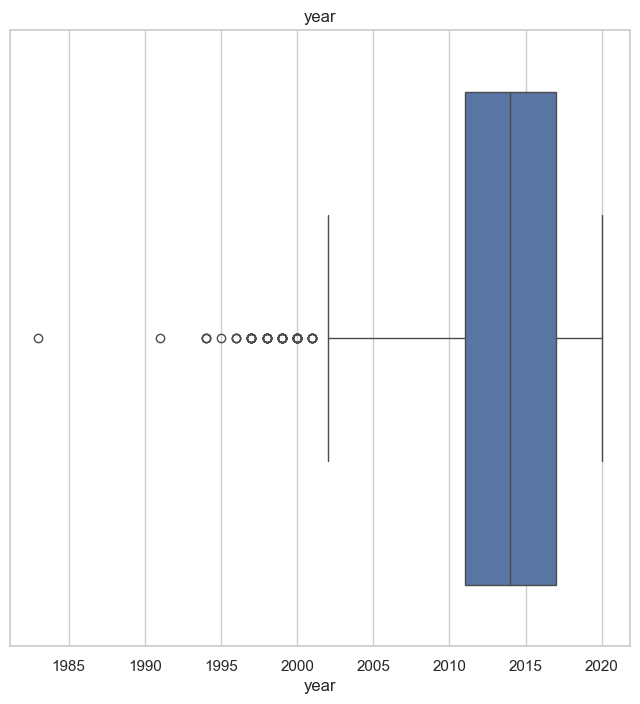

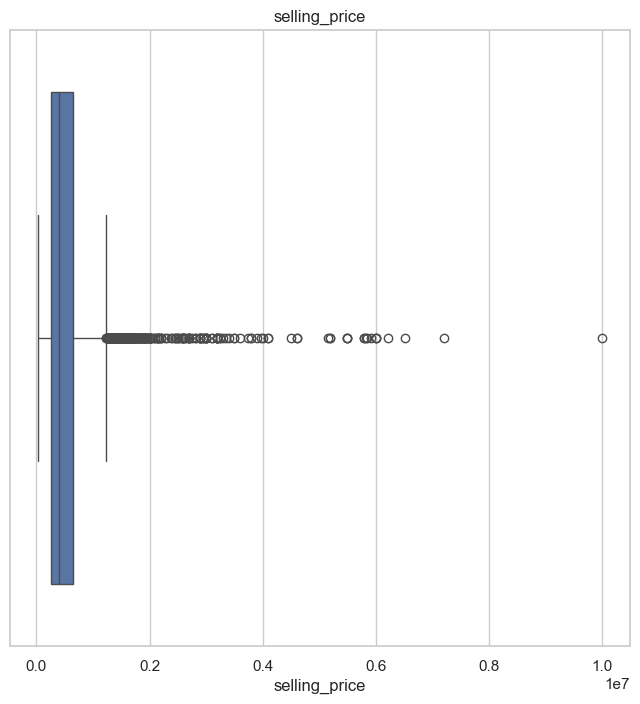

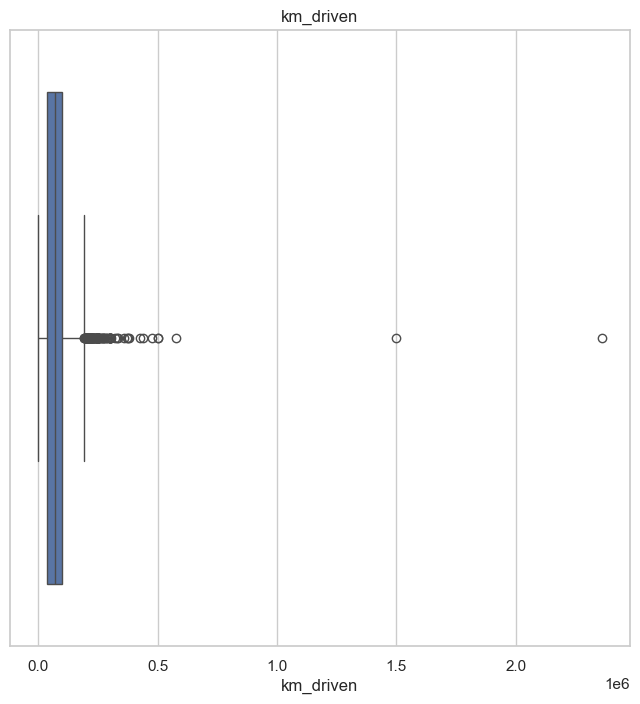

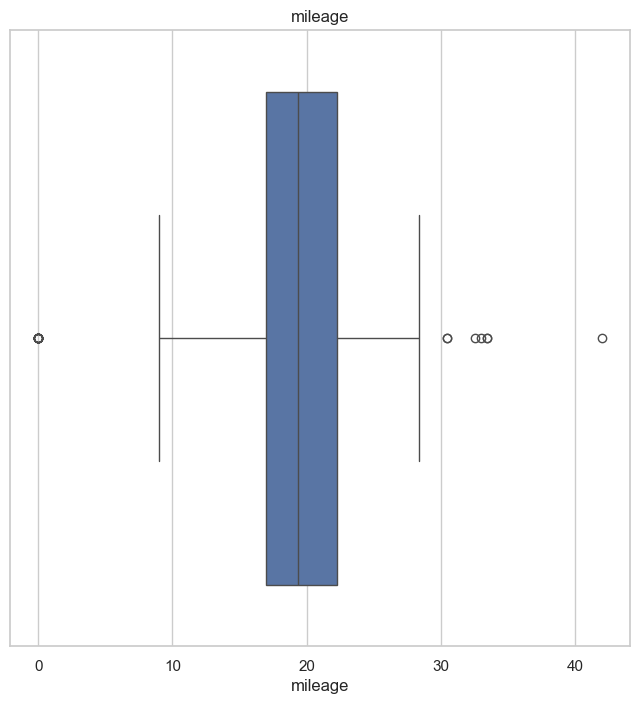

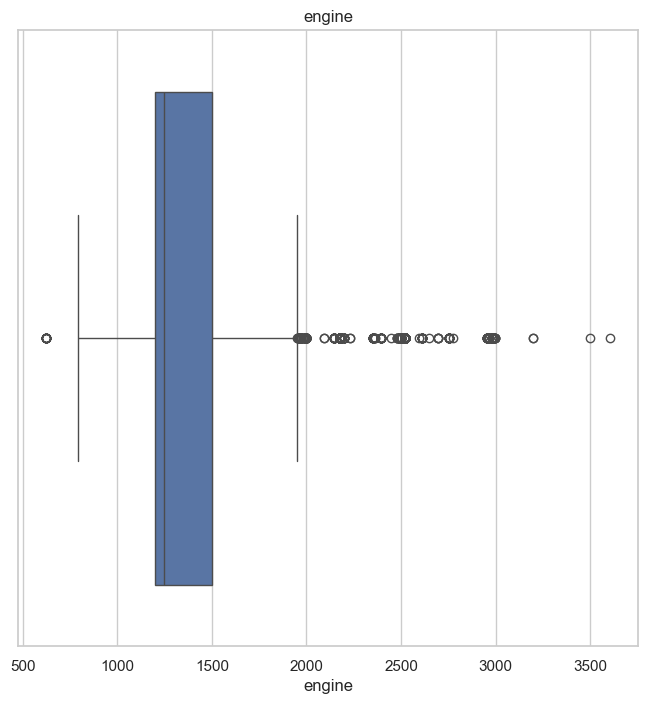

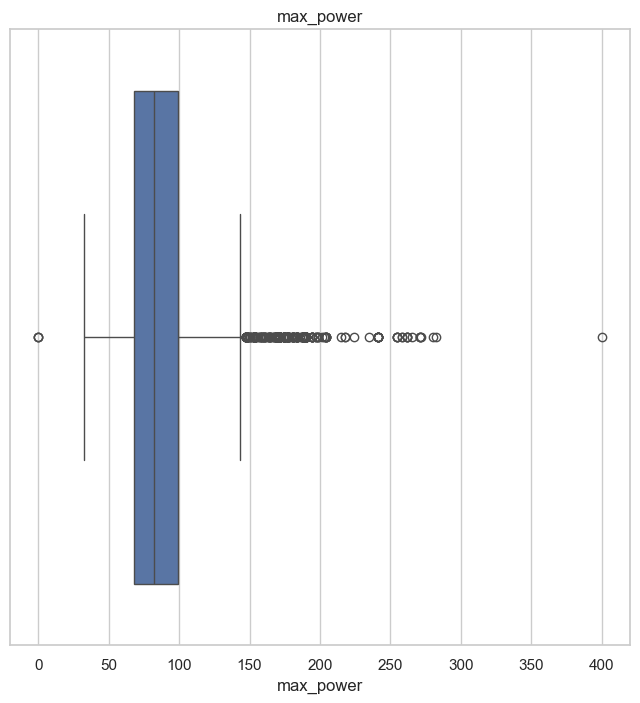

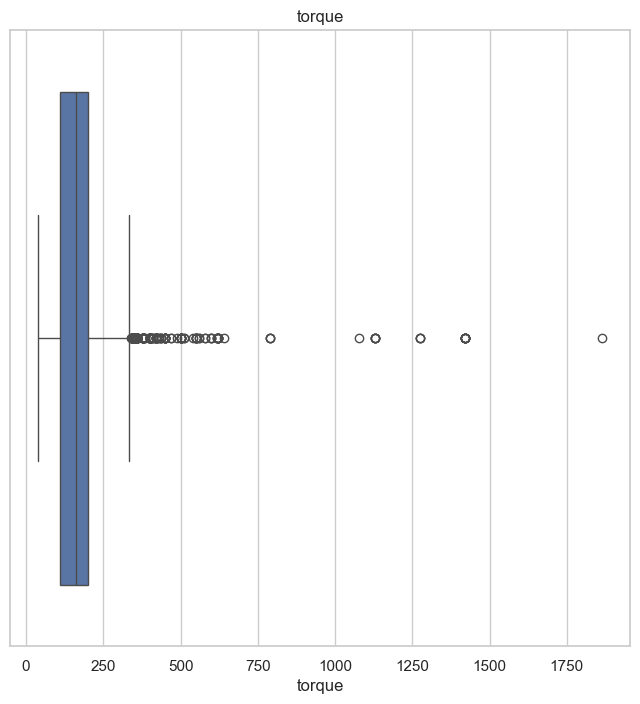

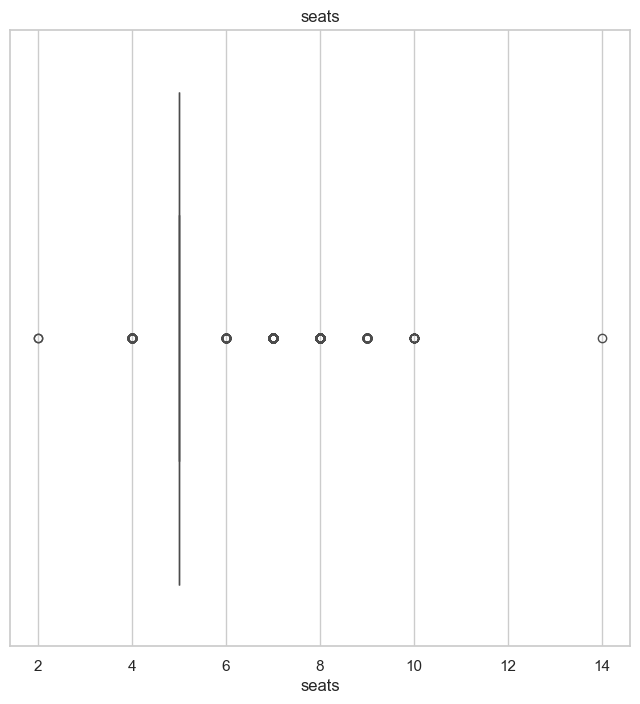

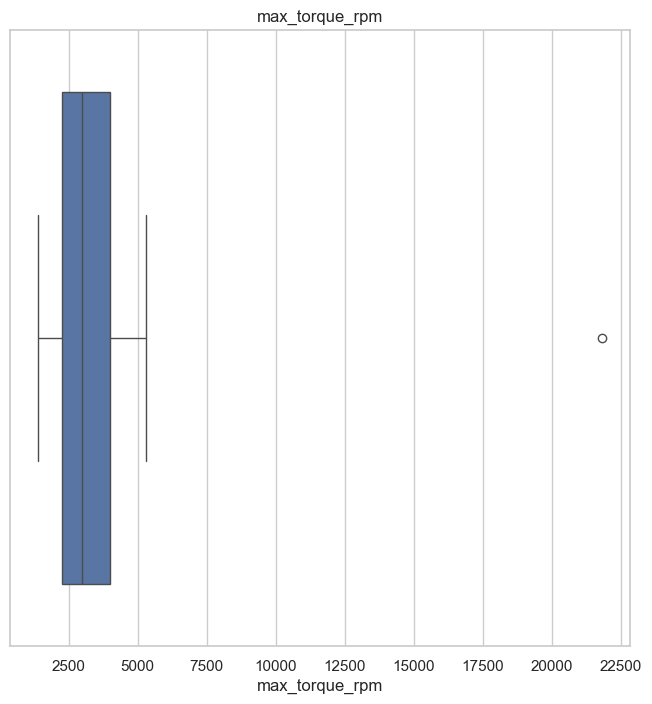

In [135]:
for col in df_train.select_dtypes(exclude=object).columns:
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.boxplot(df_train[col], orient='h')
    plt.title(col)
    plt.xlabel(col)
    plt.show()

Как можно заметить по графикам, в датасете присутствует явный выброс со слишком высоким значением признака max_torque_rpm.

In [136]:
X_train_cat[X_train_cat['max_torque_rpm'] > 10000]

,year,km_driven,mileage,engine,max_power,torque,max_torque_rpm,fuel_CNG,fuel_Diesel,fuel_LPG,...,owner_Third Owner,seats_10,seats_14,seats_2,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9
3936,2005,188000,12.3,1948,90.0,1863.263,21800.0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


Следует заменить значение в выбросе на среднее значение по признаку.

In [138]:
droped_records = X_train_cat[X_train_cat['max_torque_rpm'] > 10000]

X_train_cat.drop(droped_records.index, inplace=True)
mean_value = X_train_cat['max_torque_rpm'].mean()

droped_records.loc[droped_records.index, 'max_torque_rpm'] = mean_value
X_train_cat = pd.concat([X_train_cat, droped_records], axis=0)
X_train_cat.sort_index(inplace=True)

Стоит просмотреть диаграмму selling price на наличие выбросов.

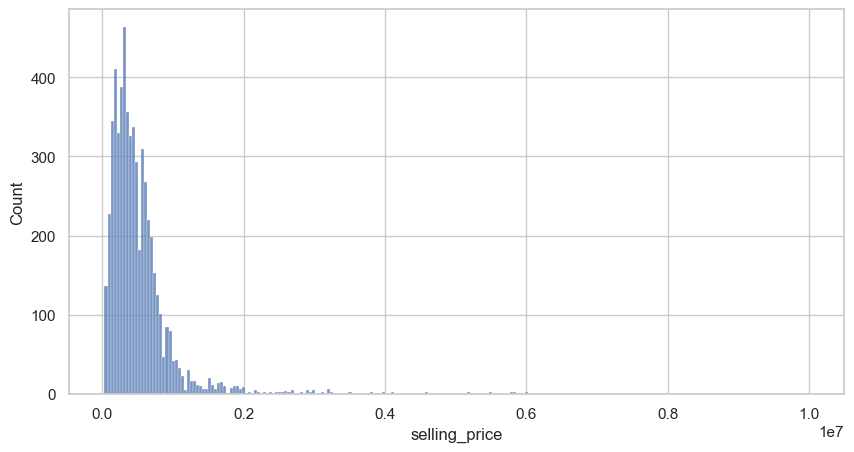

In [139]:
plt.figure(figsize=(10, 5))
sns.histplot(df_train['selling_price'])
plt.show()

In [141]:
df_train[df_train['selling_price'] > 5e6]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
118,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487,214.56,202.0,5,5200.0
121,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.50,2987,254.79,620.0,5,2400.0
124,BMW X4 M Sport X xDrive20d,2019,5800000,7500,Diesel,Dealer,Automatic,First Owner,16.78,1995,190.00,400.0,5,2500.0
132,Mercedes-Benz S-Class S 350 CDI,2017,5850000,47000,Diesel,Dealer,Automatic,First Owner,13.50,2987,282.00,490.0,5,1600.0
151,Volvo XC90 T8 Excellence BSIV,2017,10000000,30000,Petrol,Individual,Automatic,First Owner,42.00,1969,400.00,640.0,4,1740.0
330,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78,1995,190.00,400.0,5,2500.0
871,BMW 6 Series GT 630d Luxury Line,2018,6000000,28156,Diesel,Dealer,Automatic,First Owner,17.09,2993,261.40,620.0,4,2500.0
2283,BMW X7 xDrive 30d DPE,2020,7200000,5000,Diesel,Individual,Automatic,First Owner,13.38,2993,265.00,620.0,7,2500.0
3406,BMW 5 Series 520d Luxury Line,2019,5200000,10000,Diesel,Dealer,Automatic,First Owner,18.12,1995,190.00,400.0,5,2500.0
3466,BMW 6 Series GT 630d Luxury Line,2018,5500000,22000,Diesel,Individual,Automatic,First Owner,17.09,2993,261.40,620.0,4,2500.0


За выброс считать не стоит, так как для таких марок машин данная стоимость вполне реальная.

№2 - В датасете есть неиспользованный ранее признак 'name'. Достанем из него марку автомобиля.

In [142]:
name = df_train['name']
model_cars = name.str.split(' ', n=1, expand=True)
X_train_cat['model'] = model_cars[0]
X_train_models = ehc.fit_transform(X_train_cat[['model']])
X_train_models_df = pd.DataFrame(X_train_models.toarray(), columns=ehc.get_feature_names_out(['model'])).astype(int)
X_train_cat = X_train_cat.drop(['model'], axis=1)
X_train_cat_models = pd.concat([X_train_cat, X_train_models_df], axis=1)

name = df_test['name']
model_cars = name.str.split(' ', n=1, expand=True)
X_test_cat['model'] = model_cars[0]
X_test_models = ehc.transform(X_test_cat[['model']])
X_test_models_df = pd.DataFrame(X_test_models.toarray(), columns=ehc.get_feature_names_out(['model'])).astype(int)
X_test_cat = X_test_cat.drop(['model'], axis=1)
X_test_cat_models = pd.concat([X_test_cat, X_test_models_df], axis=1)

In [143]:
# Применим scaler
scaler = StandardScaler()

X_train_only_num = X_train_cat_models[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
X_train_cat_models = X_train_cat_models.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'], axis=1)
X_train_scaled = scaler.fit_transform(X_train_only_num)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_only_num.columns)
X_train_scaled = pd.concat([X_train_scaled, X_train_cat_models], axis=1)

X_test_only_num = X_test_cat_models[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
X_test_cat_models = X_test_cat_models.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'], axis=1)
X_test_scaled = scaler.transform(X_test_only_num)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test_only_num.columns)
X_test_scaled = pd.concat([X_test_scaled, X_test_cat_models], axis=1)

Для нашего обновленного датасета применим Ridge c поиском оптимальных параметров модели (оптимальные параметры находятся в данном диапазоне).

In [153]:
params = {
    'alpha': list(np.arange(0.001, 0.01, 0.001)),
    'max_iter': [15000, 30000]
}
      
grid = GridSearchCV(Ridge(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

best_cv = grid.best_estimator_
print_metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid Search Ridge')

Fitting 10 folds for each of 18 candidates, totalling 180 fits
Grid Search Ridge
TRAIN:
R2:0.7756546753895777
MSE:64305971064.69212
TEST:
R2:0.7877446998574817
MSE:122010407607.52823


In [154]:
print(' Оптимальные параметры Ridge модели:\n',grid.best_estimator_)

 Оптимальные параметры Ridge модели:
 Ridge(alpha=0.009000000000000001, max_iter=15000)


Чтобы повысить точность модели, сгенерируем полиномиальные признаки на основе входных признаков с параметром degree = 3.

In [155]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(3)

X_train_only_num = X_train_scaled[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
X_train_cat_models = X_train_scaled.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'], axis=1)
X_train_scaled = poly.fit_transform(X_train_only_num)
columns_poly = poly.get_feature_names_out(X_train_only_num.columns)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=columns_poly)
X_train_scaled = pd.concat([X_train_scaled, X_train_cat_models], axis=1)

In [156]:
X_test_only_num = X_test_scaled[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
X_test_cat_models = X_test_scaled.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'], axis=1)
X_test_scaled = poly.transform(X_test_only_num)
columns_poly = poly.get_feature_names_out(X_train_only_num.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=columns_poly)
X_test_scaled = pd.concat([X_test_scaled, X_test_cat_models], axis=1)

In [158]:
the_best = Ridge(alpha=0.009, max_iter=15000)
the_best.fit(X_train_scaled, y_train)
print_metrics(the_best, X_train_scaled, X_test_scaled, y_train, y_test, 'ElasticNet')

ElasticNet
TRAIN:
R2:0.9262542801126875
MSE:21138350609.50541
TEST:
R2:0.935866255939876
MSE:36865907465.7667


Таким образом, качество модели удалось улучшить с 60% до 93%.

# Часть Бизнесовая (0.5 балла)

Заказчик просил вас посчитать кастомную метрику -- среди всех предсказанных цен на авто посчитать долю предиктов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

<font color='#9933CC'>Сделайте это самостоятельно для лучшей из своих моделей</font>

In [159]:
def business_metrics(y_true, y_pred):
    yratio = (y_pred - y_true) / y_true * 100
    y_pred_no_more_10 = y_pred[abs(yratio) <= 10]
    return len(y_pred_no_more_10) / len(y_pred)

print('Доля предиктов, отличающихся от реальных цен на авто не более чем на 10% (в одну или другую сторону):', business_metrics(y_test, the_best.predict(X_test_scaled)))

Доля предиктов, отличающихся от реальных цен на авто не более чем на 10% (в одну или другую сторону): 0.366


# Часть 5 (2.5 балла) | Реализация сервиса на FastAPI

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from fastapi import FastAPI, UploadFile, File
from fastapi.responses import StreamingResponse
import pandas as pd
import numpy as np
from io import BytesIO
from pydantic import BaseModel
from typing import List
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
import pickle
import re

MODEL_PATH = './the_best.pkl'
ENCODER1_PATH = './encoder1.pkl'
ENCODER2_PATH = './encoder2.pkl'
SCALER1_PATH = './scaler1.pkl'
SCALER2_PATH = './scaler2.pkl'
POLY_PATH = './poly.pkl'
PATHS = [ENCODER1_PATH, ENCODER2_PATH, SCALER1_PATH, SCALER2_PATH, POLY_PATH, MODEL_PATH]

app = FastAPI()


def load_model(model_path):
    with open(model_path, 'rb') as f:
        model = pickle.load(f)
    return model


def clean_col(s):
    try:
        float_s = float(s.split()[0])
        return float_s
    except:
        return np.nan


def find_digit(s):
    try:
        return float(re.search('\d+', s).group())
    except:
        return np.nan


def find_max_torque(s):
    try:
        return max(map(float, re.findall('\d+', re.sub('[\.,]', '', s))))
    except:
        return np.nan


def kg_to_nm(s):
    return round(s * 9.80665, 3)


def split_torque(df, col_name='torque'):
    torque_nm = df[df[col_name].str.lower().str.contains('nm', na=False)][col_name]
    torque_kg = df[df[col_name].str.lower().str.contains('kg', na=False)][col_name]
    torque_nm_kg = df.loc[list(set(torque_nm.index).intersection(set(torque_kg.index))), col_name]
    index_nounits = df.index.difference(torque_nm.index).difference(torque_kg.index)
    torque_no_units = df.loc[index_nounits, col_name]
    torque_nm = torque_nm.loc[torque_nm.index.difference(torque_nm_kg.index)]
    torque_kg = torque_kg.loc[torque_kg.index.difference(torque_nm_kg.index)]

    torque_nm_split = torque_nm.str.split(' ', n=1, expand=True)
    if not torque_nm_split.empty:
        torque_nm_new = torque_nm_split[0].apply(find_digit).astype(float)
        torque_nm_max_new = torque_nm_split[1].apply(find_max_torque).astype(float)
    else:
        torque_nm_new = pd.Series(dtype=float)
        torque_nm_max_new = pd.Series(dtype=float)

    torque_kg_split = torque_kg.str.split(' ', n=1, expand=True)
    if not torque_kg_split.empty:
        torque_kg_new = torque_kg_split[0].apply(find_digit).apply(kg_to_nm).astype(float)
        torque_kg_max_new = torque_kg_split[1].apply(find_max_torque).astype(float)
    else:
        torque_kg_new = pd.Series(dtype=float)
        torque_kg_max_new = pd.Series(dtype=float)

    torque_nm_kg_split = torque_nm_kg.str.split(' ', n=1, expand=True)
    if not torque_nm_kg_split.empty:
        torque_nm_kg_new = torque_nm_kg_split[0].apply(find_digit).astype(float)
        torque_nm_kg_max_new = torque_nm_kg_split[1].apply(find_max_torque).astype(float)
    else:
        torque_nm_kg_new = pd.Series(dtype=float)
        torque_nm_kg_max_new = pd.Series(dtype=float)

    torque_no_units_split = torque_no_units.str.split(' ', n=1, expand=True)
    if not torque_no_units_split.empty:
        torque_no_units_new = torque_no_units_split[0].apply(find_digit).astype(float)
        torque_no_units_max_new = torque_no_units_split[1].apply(find_max_torque).astype(float)
    else:
        torque_no_units_new = pd.Series(dtype=float)
        torque_no_units_max_new = pd.Series(dtype=float)

    torque_new = pd.DataFrame(pd.concat([torque_nm_new, torque_kg_new, torque_no_units_new, torque_nm_kg_new], axis=0))

    torque_max_new = pd.DataFrame(
        pd.concat([torque_nm_max_new, torque_kg_max_new, torque_no_units_max_new, torque_nm_kg_max_new], axis=0))
    result_df = pd.concat([torque_new, torque_max_new], axis=1)
    result_df.columns = ['torque', 'max_torque_rpm']

    return result_df.sort_index()


def make_prediction(df, enc1_path, enc2_path, scaler1_path, scaler2_path, poly_path, model_path):
    df = pd.DataFrame(df)
    try:
        df = pd.DataFrame(np.repeat(df.set_index(0).T.values, 1, axis = 0), columns = df[0])
    except:
        pass
    df['year'] = df['year'].astype(int)
    df['km_driven'] = df['year'].astype(int)
    df['seats'] = df['seats'].astype(float)
    df['mileage'] = df['mileage'].apply(clean_col)
    df['max_power'] = df['max_power'].apply(clean_col)
    df['engine'] = df['engine'].apply(clean_col)

    df_torq = split_torque(df)
    df = df.drop('torque', axis=1)
    df = pd.concat([df, df_torq], axis=1)

    df_cat = df.drop(['name'], axis=1)
    ehc1 = load_model(enc1_path)
    categorical_features = df_cat.select_dtypes(include=['object']).columns
    df_con = pd.concat([df[categorical_features], df['seats'].astype(str)], axis=1)
    df_ohe = ehc1.transform(df_con)
    df_ohe_df = pd.DataFrame(df_ohe.toarray(), columns=['fuel_CNG', 'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol',
       'seller_type_Dealer', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Automatic',
       'transmission_Manual', 'owner_First Owner',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner', 'seats_10',
       'seats_14', 'seats_2', 'seats_4', 'seats_5', 'seats_6', 'seats_7',
       'seats_8', 'seats_9'])
    df_cat = df_cat.drop(categorical_features, axis=1)
    df_cat = pd.concat([df_cat, df_ohe_df.astype(int)], axis=1).drop(['seats'], axis=1)

    name = df['name']
    model_cars = name.str.split(' ', n=1, expand=True)
    df['model'] = model_cars[0]
    ehc2 = load_model(enc2_path)
    df_ohe = ehc2.transform(df['model'].to_numpy().reshape(-1, 1))
    df_models_df = pd.DataFrame(df_ohe.toarray(), columns=['model_Ambassador', 'model_Audi', 'model_BMW', 'model_Chevrolet',
       'model_Daewoo', 'model_Datsun', 'model_Fiat', 'model_Force',
       'model_Ford', 'model_Honda', 'model_Hyundai', 'model_Isuzu',
       'model_Jaguar', 'model_Jeep', 'model_Kia', 'model_Land',
       'model_Lexus', 'model_MG', 'model_Mahindra', 'model_Maruti',
       'model_Mercedes-Benz', 'model_Mitsubishi', 'model_Nissan',
       'model_Peugeot', 'model_Renault', 'model_Skoda', 'model_Tata',
       'model_Toyota', 'model_Volkswagen', 'model_Volvo']).astype(int)
    df_cat_models = pd.concat([df_cat, df_models_df], axis=1)

    scaler2 = load_model(scaler2_path)

    df_only_num = df_cat_models[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
    df_cat_models = df_cat_models.drop(
        ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'], axis=1)
    df_scaled = scaler2.transform(df_only_num)
    df_scaled = pd.DataFrame(df_scaled, columns=df_only_num.columns)
    df_scaled = pd.concat([df_scaled, df_cat_models], axis=1)

    poly = load_model(poly_path)

    df_only_num = df_scaled[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']]
    df_cat_models = df_scaled.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm'],
                                   axis=1)
    df_scaled = poly.transform(df_only_num)
    columns_poly = poly.get_feature_names_out(df_only_num.columns)
    df_scaled = pd.DataFrame(df_scaled, columns=columns_poly)
    df_scaled = pd.concat([df_scaled, df_cat_models], axis=1)

    elastic_model = load_model(model_path)

    return elastic_model.predict(df_scaled)


class Item(BaseModel):
    name: str
    year: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    pred = make_prediction(item, *PATHS)

    return pred


@app.post("/predict_items")
def predict_items(file: UploadFile = File(...)):
    df = pd.read_csv(BytesIO(file.file.read()))
    predictions = make_prediction(df, *PATHS)
    df['predictions'] = predictions
    output_file = BytesIO()
    df.to_csv(output_file, index=False)
    output_file.seek(0)
    response = StreamingResponse(output_file, media_type="text/csv",
                                headers={'Content-Disposition': 'attachment; filename=predictions.csv'})
    return response

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# Часть 6 (1 балл) | Оформление результатов

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете прислать screencast в ТГ
3. Просматривает ноутбук с pure-DS частью
4. Заглядывает в код сервиса
5. Хвалит

# Часть Благодарственная

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

https://drive.google.com/file/d/1LT06nyg9QgVi3r-D5BY-_mQ9TcJQFxJN/view?usp=share_link